In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
sc.settings.verbosity = 3             
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=96)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.6 numpy==1.19.3 scipy==1.5.1 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


In [2]:
covid = sc.read_h5ad('./covid.h5ad')

In [3]:
covid

AnnData object with n_obs × n_vars = 8036 × 18071
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Diagnosis', 'Sample_Name', 'Sample_Source', 'Status', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'population', 'celltype', 'SCT_snn_res.1', 'SCT_snn_res.0.6', 'SCT_snn_res.1.5', 'integrated_snn_res.0.6', 'types', 'integrated_snn_res.1'
    var: 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_mean', 'sct.residual_variance', 'sct.variable'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

... storing 'orig.ident' as categorical
... storing 'Diagnosis' as categorical
... storing 'Sample_Name' as categorical
... storing 'Sample_Source' as categorical
... storing 'Status' as categorical
... storing 'seurat_clusters' as categorical
... storing 'population' as categorical
... storing 'celltype' as categorical
... storing 'SCT_snn_res.1' as categorical
... storing 'SCT_snn_res.0.6' as categorical
... storing 'SCT_snn_res.1.5' as categorical
... storing 'integrated_snn_res.0.6' as categorical
... storing 'types' as categorical
... storing 'integrated_snn_res.1' as categorical


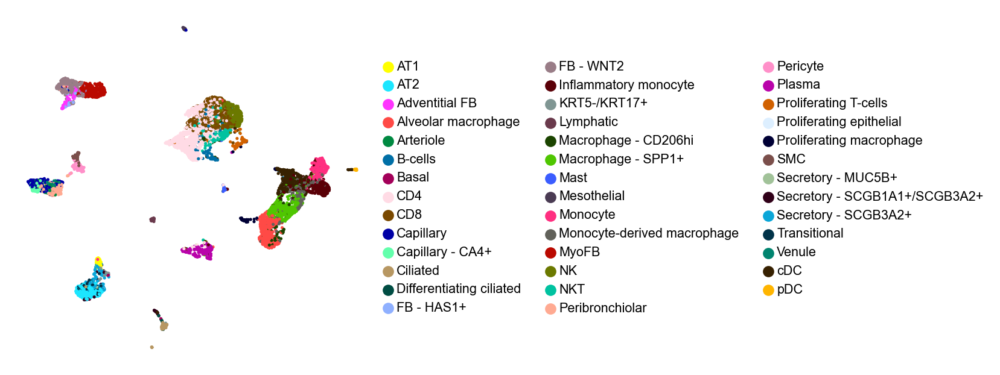

In [4]:
sc.pl.umap(covid, color='types', frameon=False, legend_fontsize='xx-small', title='')

In [5]:
sc.pp.neighbors(covid, n_neighbors=10, n_pcs=35)

computing neighbors
    using 'X_pca' with n_pcs = 35
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


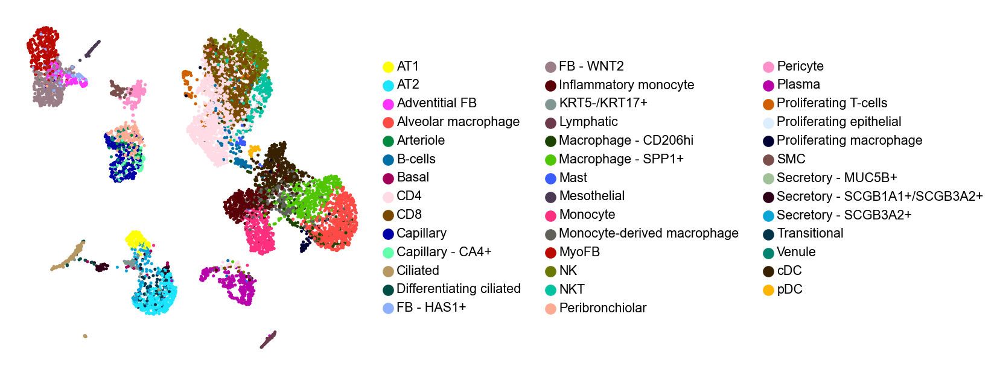

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [6]:
sc.tl.umap(covid)
sc.pl.umap(covid, color='types', frameon=False, title='', legend_fontsize='xx-small')
sc.tl.paga(covid, groups='types')
sc.pl.paga(covid, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(covid, init_pos='paga')

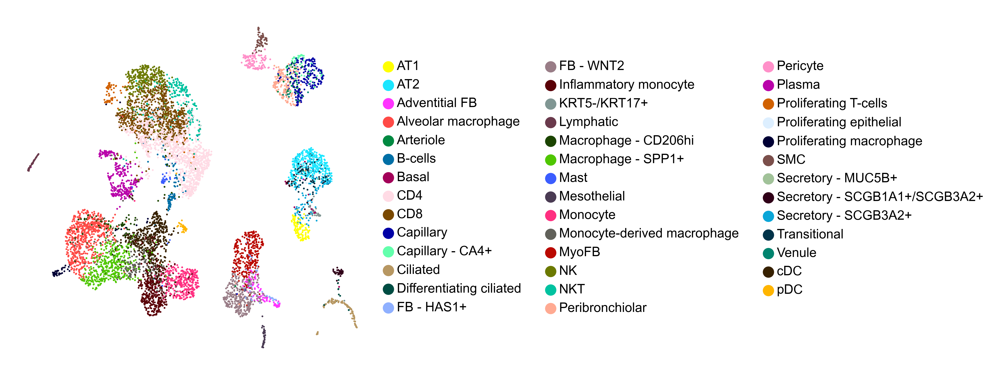

In [7]:
from matplotlib import rcParams
sc.settings.set_figure_params(dpi=300)
rcParams['figure.figsize'] = 4,4
sc.pl.umap(covid, color='types', frameon=False, title='', legend_fontsize='xx-small', s=5)

In [8]:
covid_epi = covid[covid.obs['types'].isin(['AT1', 'AT2', 'Basal', 'Transitional', 'KRT5-/KRT17+', 'Secretory - SCGB1A1+/SCGB3A2+', 'Secretory - SCGB3A2+', 'Secretory - MUC5B+', 'Proliferating epithelial', 'Differentiating ciliated', 'Ciliated'])]

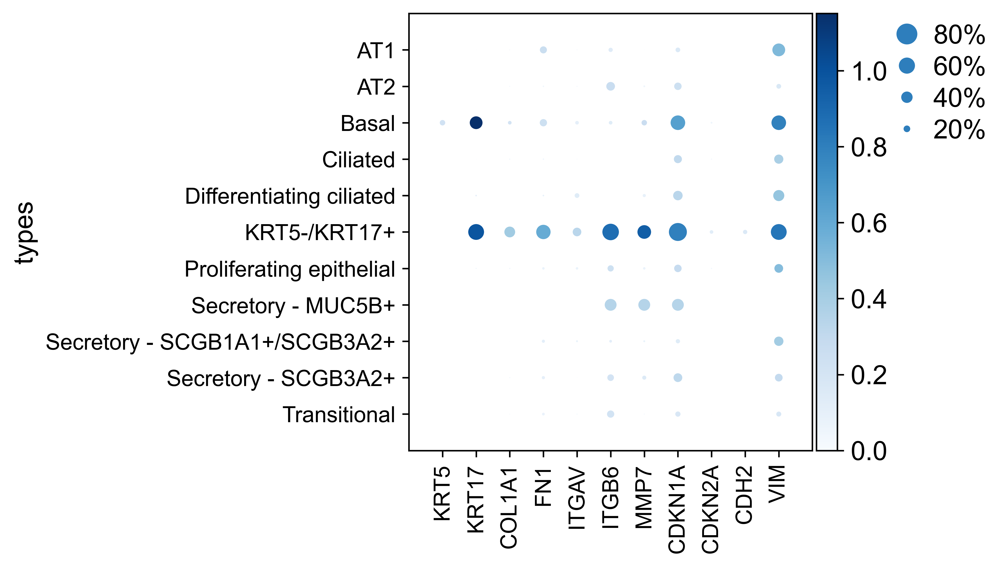

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.8499999999999996, 0, 0.2, 0.5, 0.25])

In [9]:
sc.settings.set_figure_params(dpi=300)
rcParams['figure.figsize'] = 3,3
sc.pl.dotplot(covid_epi, ['KRT5', 'KRT17', 'COL1A1', 'FN1', 'ITGAV', 'ITGB6', 'MMP7', 'CDKN1A', 'CDKN2A', 'CDH2', 'VIM'], groupby='types', color_map='Blues')

In [10]:
epi = sc.read_h5ad('./epithelial_integrated.h5ad')

... storing 'orig.ident' as categorical
... storing 'Diagnosis' as categorical
... storing 'Sample_Name' as categorical
... storing 'Sample_Source' as categorical
... storing 'Status' as categorical
... storing 'population' as categorical
... storing 'celltype' as categorical
... storing 'SCT_snn_res.1' as categorical
... storing 'SCT_snn_res.0.6' as categorical
... storing 'SCT_snn_res.1.5' as categorical


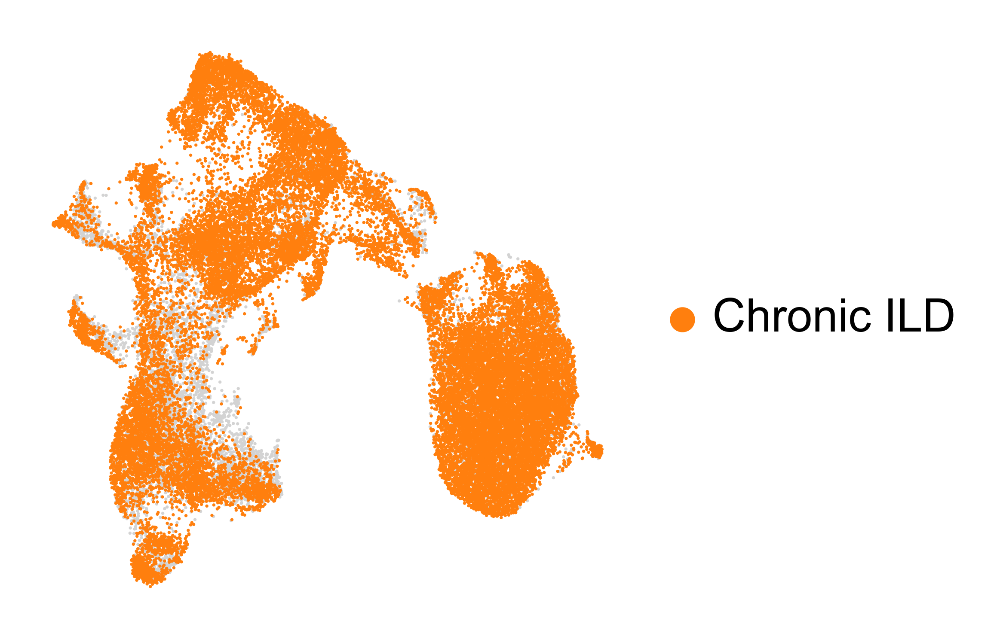

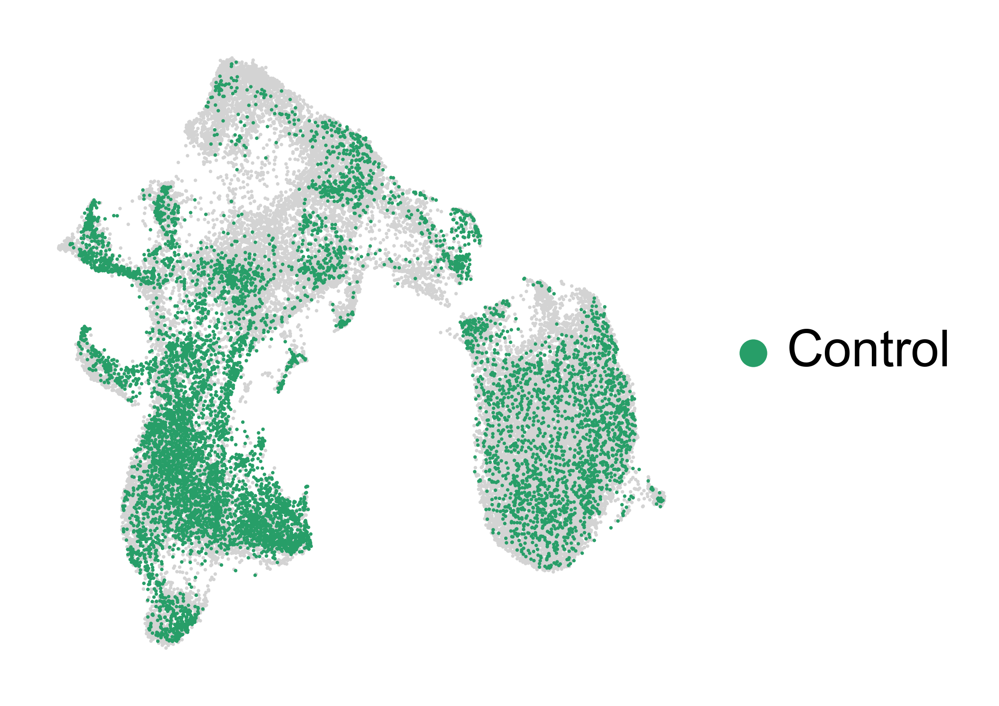

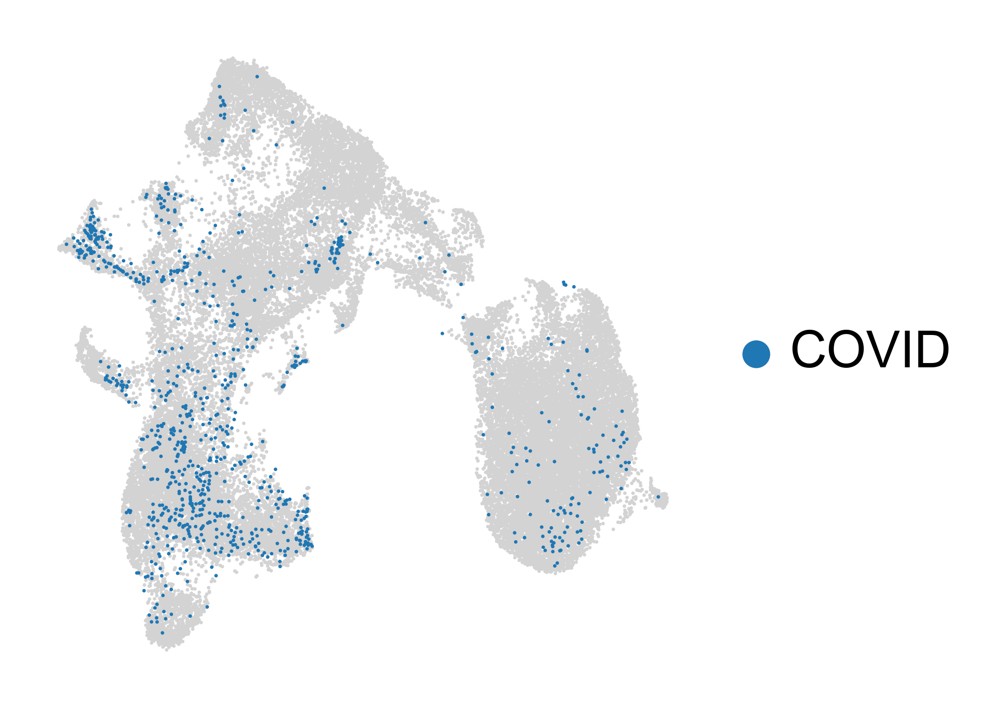

In [11]:
for batch in ['Chronic ILD', 'Control', 'COVID']:
    sc.pl.umap(epi, color='Status', groups=[batch], title='', frameon=False)

In [12]:
epi.obs['types'] = epi.obs['types'].astype('category')

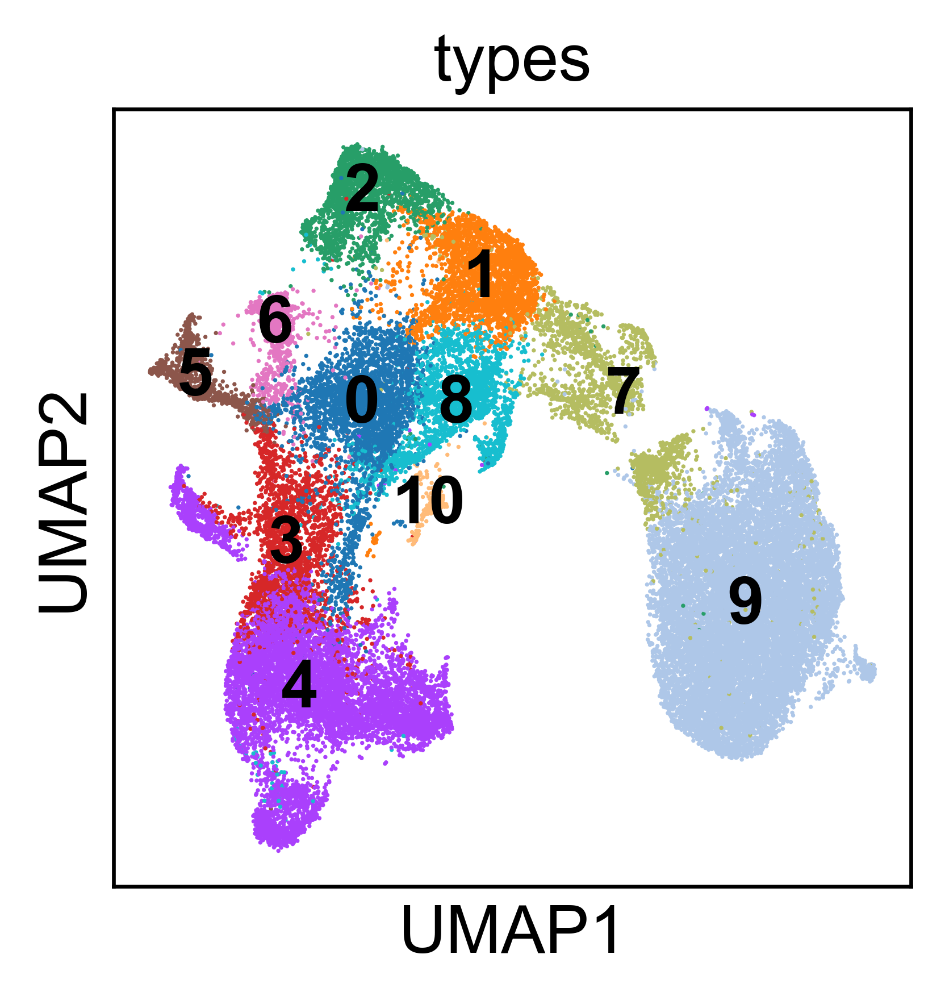

In [13]:
sc.pl.umap(epi, color='types', legend_loc='on data')

In [14]:
new_cluster_names =[
    'Secretory - SCGB3A2+',
    'Secretory - MUC5B+',
    'Basal',
    'Transitional',
    'AT2',
    'AT1',
    'KRT5-/KRT17+',
    'Differentiating ciliated',
   'Secretory - SCGB1A1+/SCGB3A2+',
    'Ciliated',
    'Proliferating epithelial',
]

epi.rename_categories('types', new_cluster_names)

In [15]:
krt17 = epi[epi.obs['types'].isin(['KRT5-/KRT17+'])]
krt17_genes =['KRT5', 'KRT17', 'SFN', 'SOX4', 'TM4SF1','COL1A1', 'FN1', 'MMP7', 'ITGAV', 'ITGB6', 'CDKN1A', 'CDKN2A', 'VIM', 'CDH2']

In [16]:
krt17

View of AnnData object with n_obs × n_vars = 813 × 24847
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Diagnosis', 'Sample_Name', 'Sample_Source', 'Status', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'population', 'celltype', 'SCT_snn_res.1', 'SCT_snn_res.0.6', 'SCT_snn_res.1.5', 'integrated_snn_res.0.6', 'types'
    var: 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_mean', 'sct.residual_variance', 'sct.variable'
    uns: 'Status_colors', 'types_colors'
    obsm: 'X_umap'

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
Storing dendrogram info using `.uns['dendrogram_Status']`


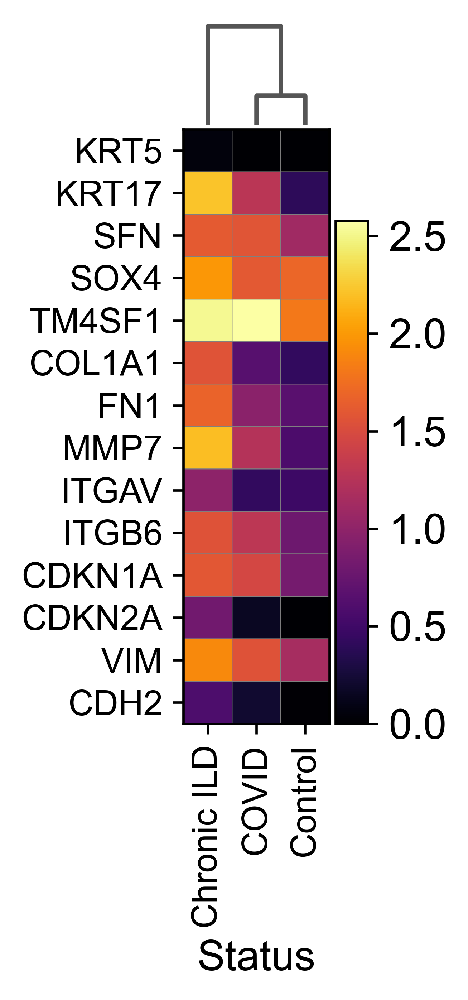

GridSpec(2, 3, height_ratios=[0.5, 2.8000000000000003], width_ratios=[0.8999999999999999, 0, 0.2])

In [17]:
sc.pl.matrixplot(krt17, krt17_genes, groupby='Status', dendrogram=True, cmap='inferno', swap_axes=True)

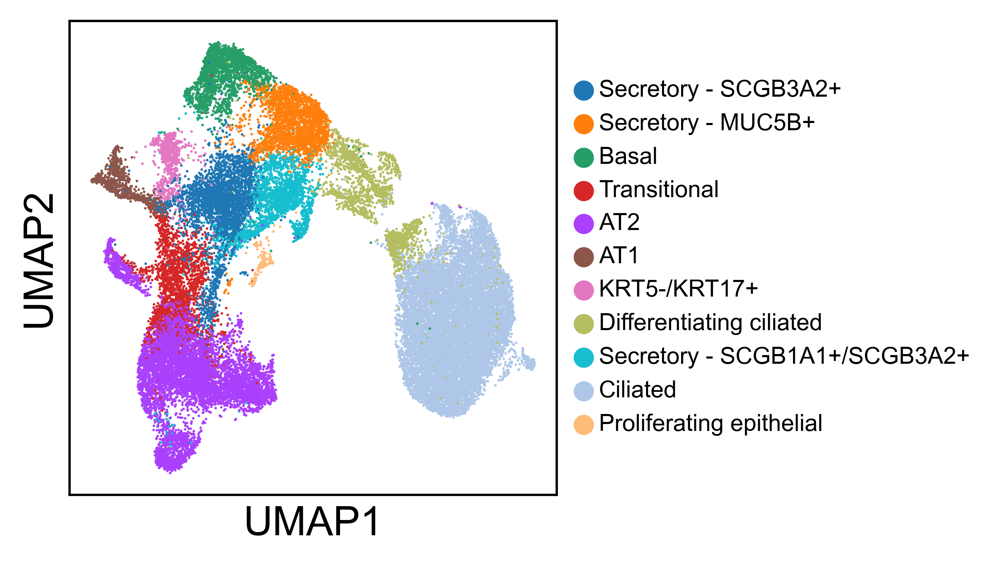

In [18]:
sc.pl.umap(epi, color='types', title='', legend_fontsize='xx-small')

In [19]:
stromal = sc.read_h5ad('./stromal_integrated.h5ad')

... storing 'orig.ident' as categorical
... storing 'Diagnosis' as categorical
... storing 'Sample_Name' as categorical
... storing 'Sample_Source' as categorical
... storing 'Status' as categorical
... storing 'population' as categorical
... storing 'celltype' as categorical
... storing 'SCT_snn_res.1' as categorical
... storing 'SCT_snn_res.0.6' as categorical
... storing 'SCT_snn_res.1.5' as categorical


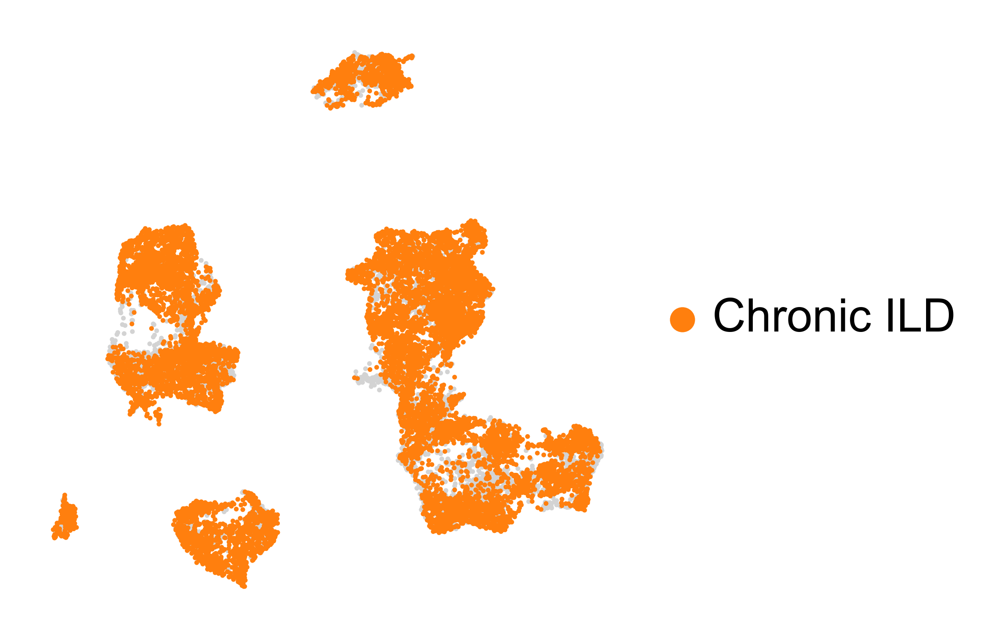

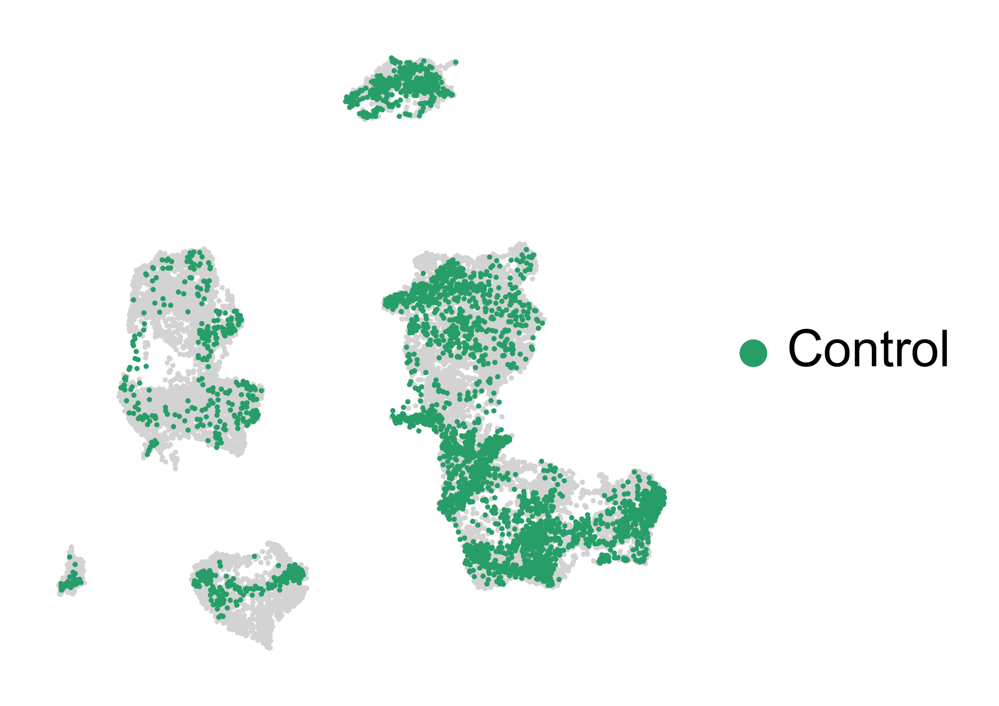

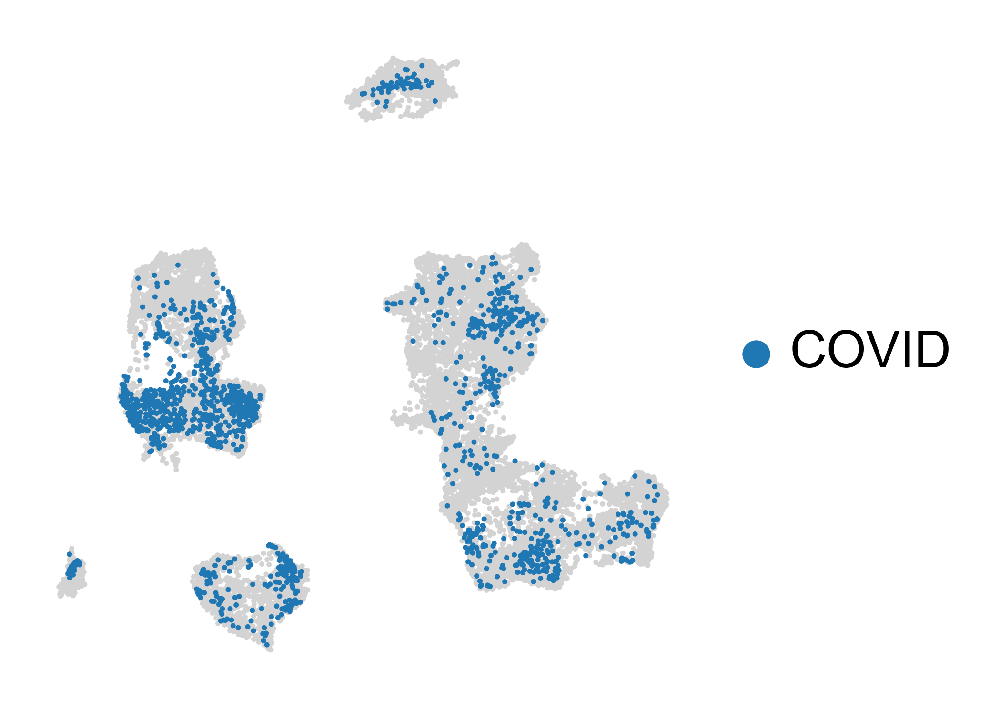

In [20]:
for batch in ['Chronic ILD', 'Control', 'COVID']:
    sc.pl.umap(stromal, color='Status', groups=[batch], title='', frameon=False)

In [21]:
stromal.obs['types'] = stromal.obs['types'].astype('category')

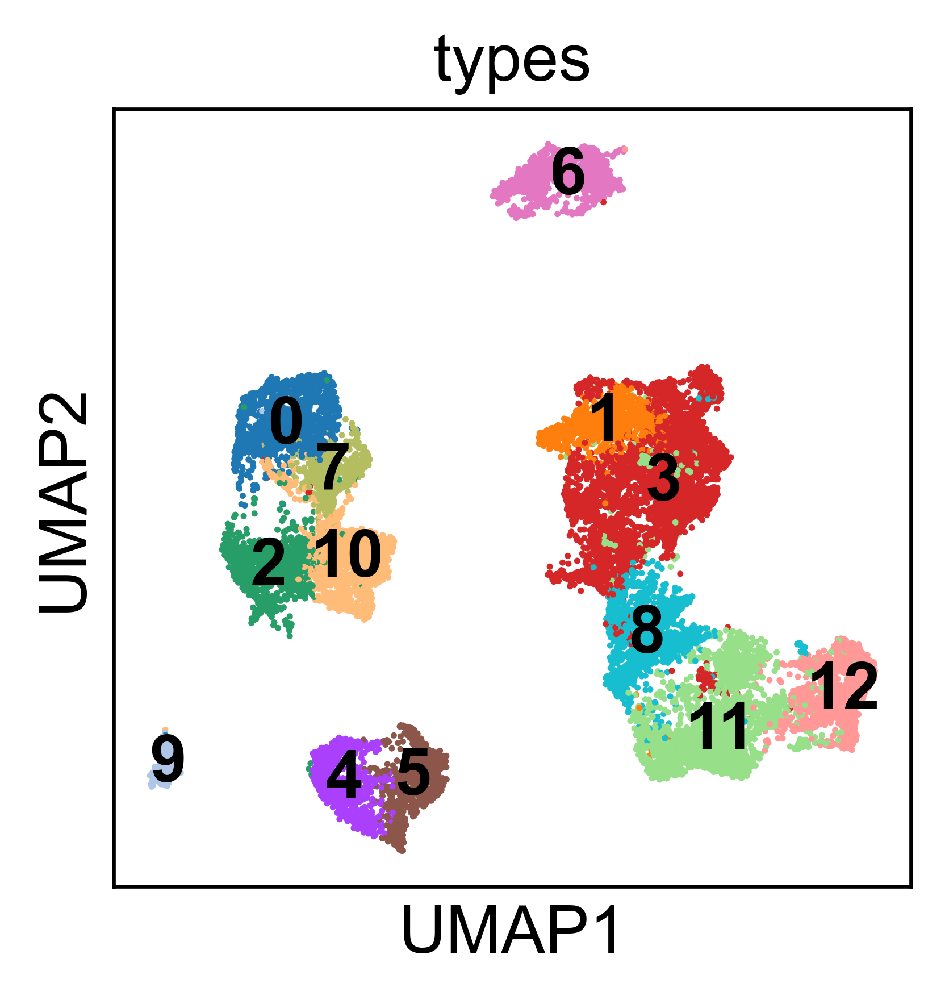

In [22]:
sc.pl.umap(stromal, color='types', legend_loc='on data')

In [23]:
new_cluster_names =[
    'FB-HAS1+',
    'Venule',
    'MyoFB',
    'Peribronchiolar',
    'SMC',
    'Pericyte',
    'Lymphatic',
    'Adventitial FB',
   'Arteriole',
    'Mesothelial',
    'FB - WNT2',
    'Capillary',
    'Capillary - CA4+'
]

stromal.rename_categories('types', new_cluster_names)

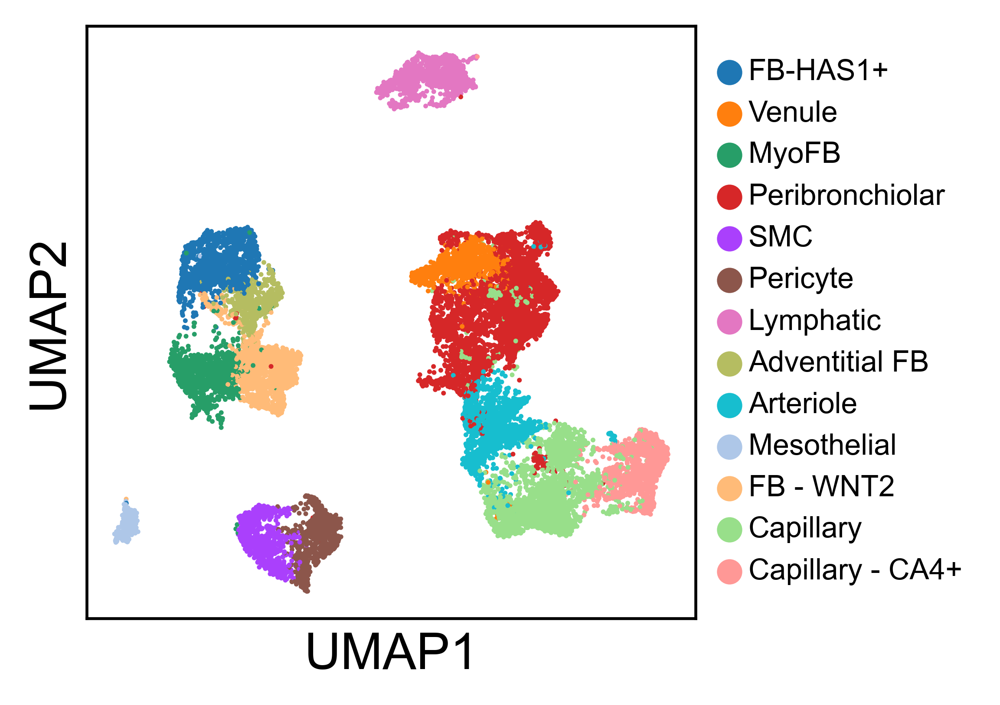

In [24]:
sc.pl.umap(stromal, color='types', legend_fontsize='xx-small', title='')

In [25]:
covid_fb = covid[covid.obs['types'].isin(['MyoFB', 'FB - WNT2', 'FB - HAS1+', 'Adventitial FB'])]
myofb = stromal[stromal.obs['types'].isin(['MyoFB'])]
wnt2 = stromal[stromal.obs['types'].isin(['FB - WNT2'])]


In [26]:
matrix_genes = ['CTHRC1', 'COL1A1', 'COL1A2', 'COL3A1', 'COL6A1', 'COL8A1', 'FN1', 'DCN', 'LUM', 'ELN']

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_types']`


Trying to set attribute `.uns` of view, copying.


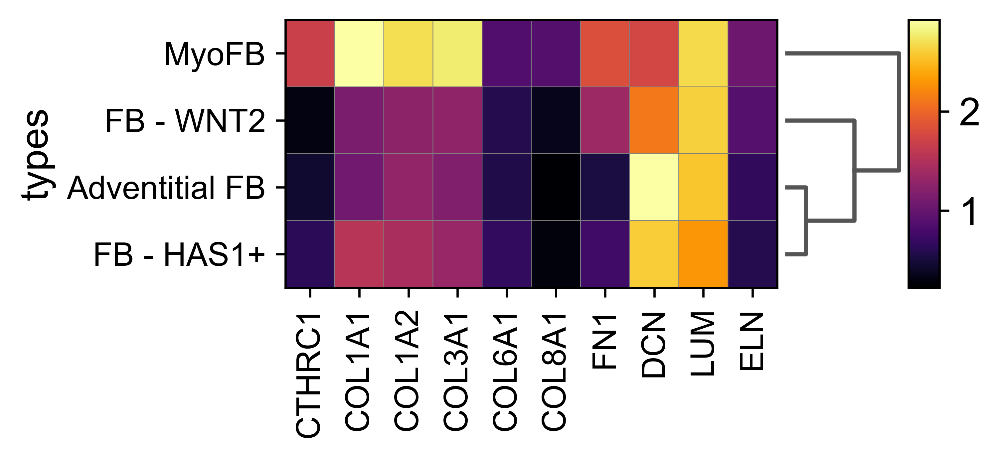

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.2, 0.8, 0.2])

In [27]:
sc.pl.matrixplot(covid_fb, matrix_genes, dendrogram=True, groupby='types', cmap='inferno', swap_axes=False)

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
Storing dendrogram info using `.uns['dendrogram_Status']`


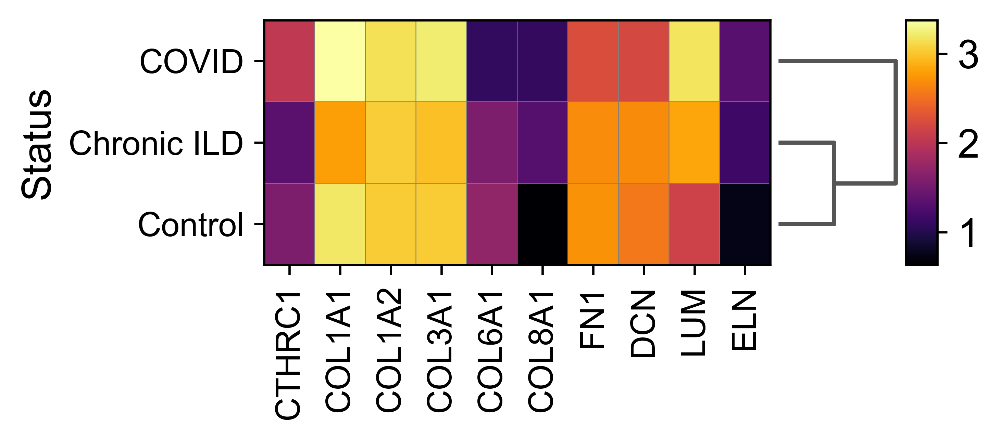

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.2, 0.8, 0.2])

In [28]:
sc.pl.matrixplot(myofb, matrix_genes, dendrogram=True, groupby='Status', cmap='inferno', swap_axes=False)

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
Storing dendrogram info using `.uns['dendrogram_Status']`


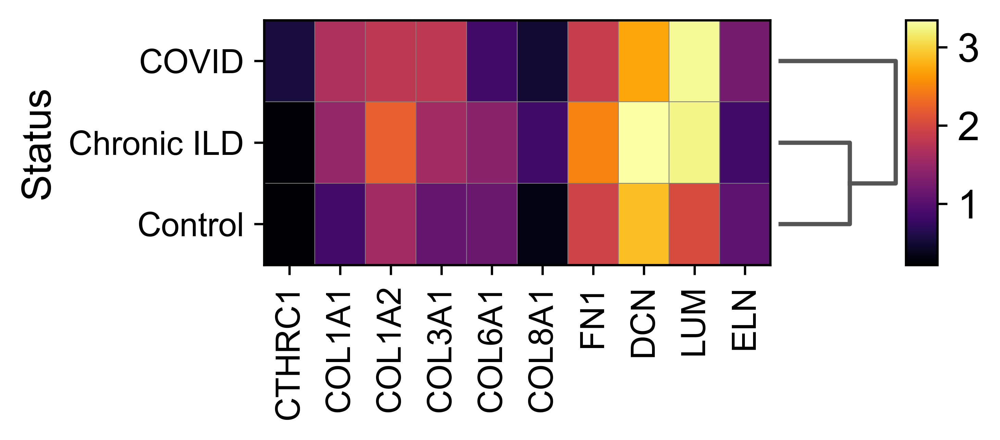

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.2, 0.8, 0.2])

In [29]:
sc.pl.matrixplot(wnt2, matrix_genes, dendrogram=True, groupby='Status', cmap='inferno', swap_axes=False)

In [30]:
immune = sc.read_h5ad('./immune_integrated.h5ad')

... storing 'orig.ident' as categorical
... storing 'Diagnosis' as categorical
... storing 'Sample_Name' as categorical
... storing 'Sample_Source' as categorical
... storing 'Status' as categorical
... storing 'population' as categorical
... storing 'celltype' as categorical
... storing 'SCT_snn_res.1' as categorical


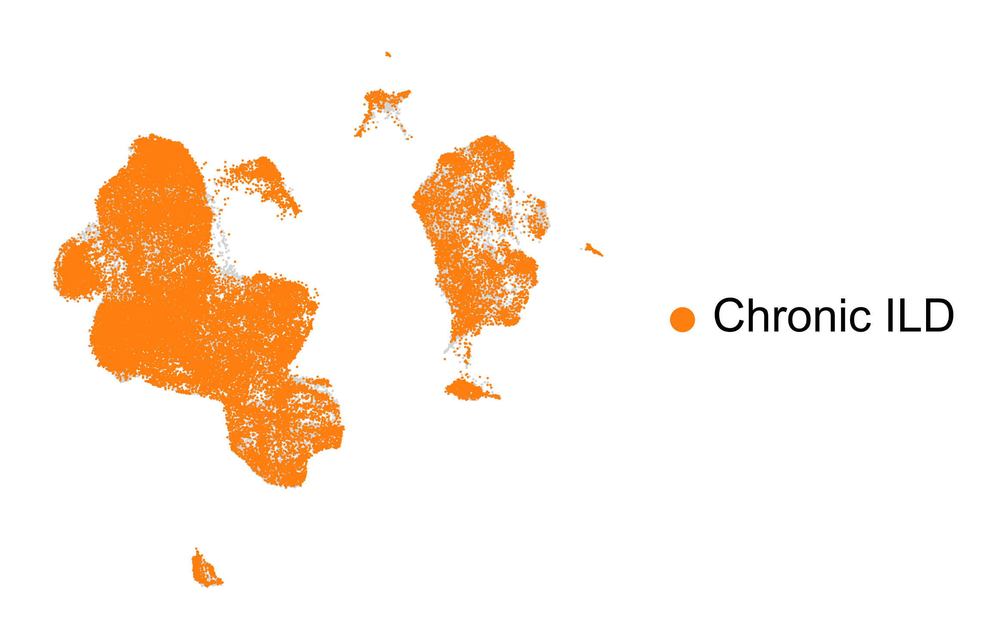

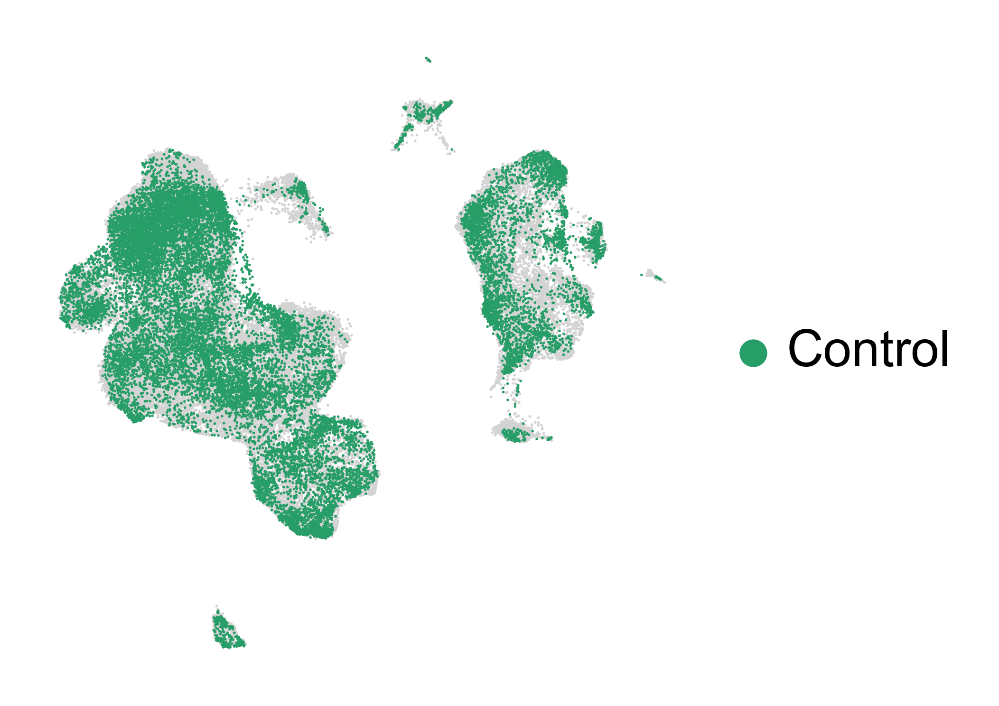

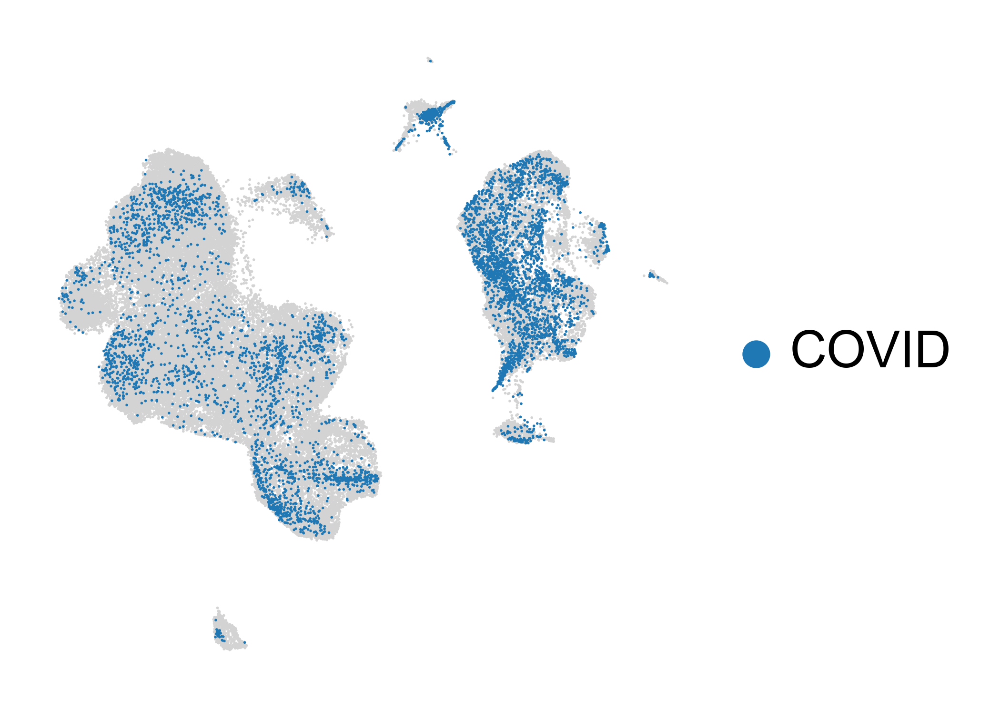

In [31]:
for batch in ['Chronic ILD', 'Control', 'COVID']:
    sc.pl.umap(immune, color='Status', groups=[batch], title='', frameon=False)

In [32]:
immune.obs['types'] = immune.obs['types'].astype('category')

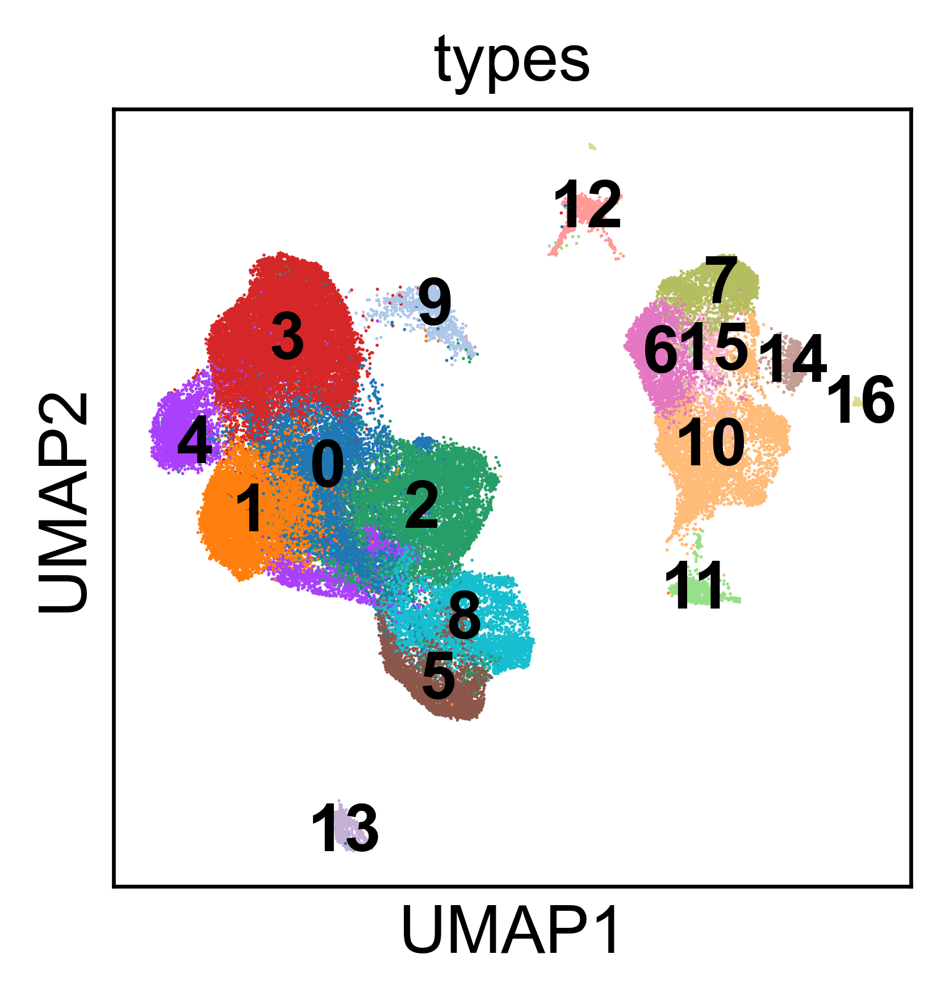

In [33]:
sc.pl.umap(immune, color='types', legend_loc='on data')

In [34]:
new_cluster_names =[
    'Monocyte-derived macrophage',
    'Macrophage - SPP1+',
    'cDC',
    'Alveolar macrophage',
    'Macrophage - CD206hi',
    'Monocyte',
    'CD8',
    'NK',
    'Inflammatory monocyte',
    'Proliferating macrophage',
    'CD4',
    'B cells',
    'Plasma',
    'Mast',
    'Proliferating T-cells',
    'NKT',
    'pDC'
]

immune.rename_categories('types', new_cluster_names)

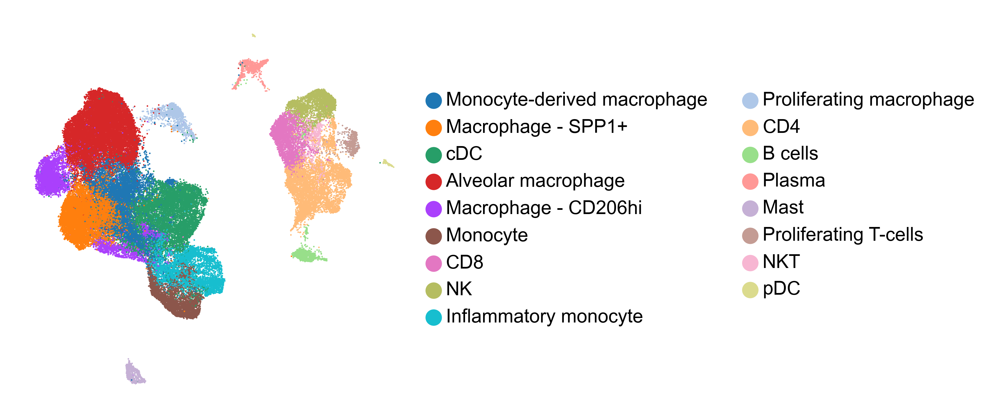

In [35]:
sc.pl.umap(immune, color='types', legend_fontsize='xx-small', title='', frameon=False)

In [36]:
marker_genes = ['EPCAM', 'MKI67', 'ABCA3', 'CEACAM6', 'AGER', 'SCGB1A1', 'SCGB3A2', 'KRT5', 'KRT17', 'PECAM1', 'ACKR1', 'CA4', 'PLVAP', 'HEY1', 'APLNR', 'COL1A1', 'CTHRC1', 'WNT2', 'PI16', 'HAS1', 'CSPG4', 'ACTA2', 'CCL21', 'WT1', 'PTPRC', 'CD86', 'HLA-DRA', 'CD14', 'IL1B', 'MRC1', 'PPARG', 'SPP1', 'CD19', 'CD3E', 'IL7R','CD8A', 'GNLY', 'FOXJ1', 'CPA3', 'JCHAIN', 'IRF7']

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_types']`


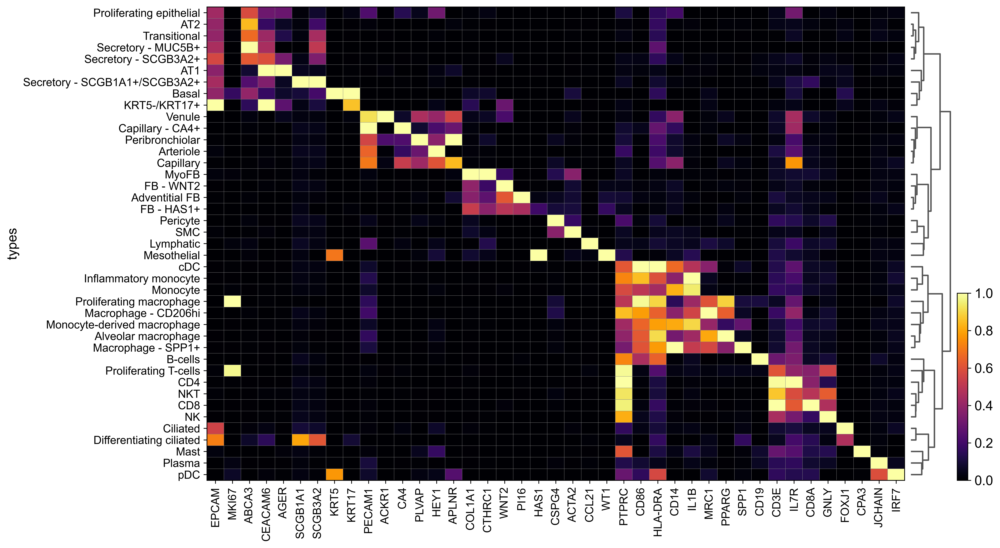

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[13.120000000000001, 0.8, 0.2])

In [37]:
sc.pl.matrixplot(covid, marker_genes, dendrogram=True, groupby='types', standard_scale='var', cmap='inferno')